<a href="https://colab.research.google.com/github/armando-larocca/Tesina_MML/blob/master/MML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **TESINA ON MAGIC DATASET**



In [ ]:
#pip install scikit-plot

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Useful functions

In [3]:
def undersampling(df_train, c_h):

  df_class_0 = df_train[df_train[10] == "g"]
  df_class_1 = df_train[df_train[10] == "h"]

  df_class_0_under = df_class_0.sample(c_h)
  df_test_under = pd.concat([df_class_0_under, df_class_1], axis=0)

  print('Random under-sampling:')


  under_sampling = pd.DataFrame(df_test_under).to_numpy()

  under_data = under_sampling[: , : len(df_test_under.columns)-1]
  under_labels = under_sampling[: , len(df_test_under.columns)-1]
  print(len(under_labels))

  df_test_under.describe()


  return under_data, under_labels

def mixsampling (X_train,y_train):
  from imblearn.combine import SMOTETomek
  import seaborn as sns

  smote_tomek = SMOTETomek(random_state=0)
  p_x1 , p_y1 = smote_tomek.fit_resample(X_train, y_train)

  sns.countplot(p_y1)

  prova1 = pd.DataFrame(p_x1)
  prova1.describe()

  return p_x1, p_y1

def oversampling (df_train, c_g):

  df_class_0 = df_train[df_train[10] == "g"]
  df_class_1 = df_train[df_train[10] == "h"]

  df_class_1_over = df_class_1.sample(c_g, replace=True)
  df_test_over = pd.concat([df_class_0, df_class_1_over], axis=0)

  print('Random over-sampling:')

  over_sampling = pd.DataFrame(df_test_over).to_numpy()

  over_data = over_sampling[: , : len(df_test_over.columns)-1]
  over_labels = over_sampling[: , len(df_test_over.columns)-1]
  print(len(over_labels))

  df_test_over.describe()

  return over_data, over_labels

def training(X_test ,y_test, balance_data, balance_labels, clf, ROC=None):

  from sklearn import metrics
  from sklearn.metrics import confusion_matrix
  from matplotlib import pyplot as plt
  from sklearn import preprocessing
  from sklearn.preprocessing import StandardScaler
  from sklearn.preprocessing import MinMaxScaler

  scaler = MinMaxScaler()
  scaler.fit(balance_data)
  data_test = scaler.transform(X_test)
  data_train = scaler.transform(balance_data)


  clf.fit(data_train, balance_labels)
  y_pred = clf.predict(data_test)


  test = []
  pred = []
  for x,y in zip(y_pred,y_test):
    if x == 'g':
      pred.append(1)
    else: pred.append(0)

    if y == 'g':
      test.append(1)
    else: test.append(0)


  print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
  print("F1-score:",metrics.f1_score(y_test, y_pred,pos_label="g"))
  print("Auc:",metrics.roc_auc_score(test, pred))

  conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
  print('Confusion matrix:\n', conf_mat)

  label = ['G', 'B']
  fig = plt.figure(figsize=(10, 10))
  ax = fig.add_subplot(111)
  cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
  fig.colorbar(cax)
  ax.set_xticklabels([''] + label)
  ax.set_yticklabels([''] + label)
  plt.xlabel('Predicted')
  plt.ylabel('Expected')
  plt.show()

  print("\n")
  print("\n")

  if ROC != None:
    ROC_analysis(clf, data_test, y_test)


  test = []
  pred = []
  for x,y in zip(y_pred,y_test):
    if x == 'g':
      pred.append(1)
    else: pred.append(0)

    if y == 'g':
      test.append(1)
    else: test.append(0)
  

  roc = metrics.roc_auc_score(test, pred)
  f1 = metrics.f1_score(y_test, y_pred,pos_label="g")
  acc = metrics.accuracy_score(y_test, y_pred)

  return acc,f1,roc

def ROC_analysis(clf , data_test, y_test):

  import scikitplot as skplt
  import matplotlib.pyplot as plt
  from sklearn.metrics import roc_curve, auc
  from sklearn import metrics

  probs = clf.predict_proba(data_test)
  probs = probs[:, 0]

  test = []
  pred = []
  for y in y_test:
    #if x == 'g':
    #  pred.append(1)
    #else: pred.append(0)

    if y == 'g':
      test.append(1)
    else: test.append(0)

  fpr = dict()
  tpr = dict()
  roc_auc = dict()
  for i in range(2):
    fpr[i], tpr[i], tresh = roc_curve(np.array(test), probs)
    #fpr[i], tpr[i], tresh = roc_curve(y_test, y_pred, pos_label="g" )
    roc_auc[i] = auc(fpr[i], tpr[i])

  #print(metrics.roc_auc_score(test, pred))

  index = None
  for x in tresh:
    if x < 0.2 and index == None: 
      index = list(tresh).index(x)
  print(index)    

  print("x",fpr[0])
  print("y",tpr[0])

  plt.figure(figsize=(13, 10))
  lw = 3
  plt.plot(fpr[0], tpr[0], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
  plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
  plt.axvline(  list(fpr[0])[index],    color='black', lw=lw)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver operating characteristic example')
  plt.legend(loc="lower right")
  plt.show()

**Data cleaning**

In [4]:
from pathlib import Path
import pandas as pd
import numpy as np
from ipywidgets import widgets
from pandas_profiling import ProfileReport
#from pandas_profiling.utils.cache import cache_file
import matplotlib as mpl 
mpl.use('agg')
import matplotlib.pyplot as plt 
import matplotlib


df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/magic/magic04.data',header=None)
dati_grezzi = pd.DataFrame(df).to_numpy()
df.columns = ['1.fLength','2.fWidth','3.fSize','4.fConc','5.fConc',
          '6.fAsym','7.fM3Long','8.fM3Trans','9.fAlpha', '10.fDist','11. class']
df.describe()


no_corr = df.drop(columns=['5.fConc'],axis=1)

#Elimino i doppioni 
no_copy_df = no_corr.drop_duplicates(subset=['1.fLength','2.fWidth','3.fSize','4.fConc',
         '6.fAsym','7.fM3Long','8.fM3Trans','9.fAlpha', '10.fDist','11. class'] ,keep='first', inplace=False)
no_copy = pd.DataFrame(no_copy_df).to_numpy()

data = dati_grezzi[: , :10]
labels = dati_grezzi[: , 10]
print("Dataset samples:",len(labels))

no_copy_data = no_copy[: , :len(no_copy_df.columns)-1]
no_copy_labels = no_copy[: , len(no_copy_df.columns)-1]
print("Dataset samples without duplicates:",len(no_copy_labels))

df.describe()

Dataset samples: 19020
Dataset samples without duplicates: 18905


,1.fLength,2.fWidth,3.fSize,4.fConc,5.fConc,6.fAsym,7.fM3Long,8.fM3Trans,9.fAlpha,10.fDist
count,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000
mean,53.250154,22.180966,2.825017,0.380327,0.214657,-4.331745,10.545545,0.249726,27.645707,193.818026
std,42.364855,18.346056,0.472599,0.182813,0.110511,59.206062,51.000118,20.827439,26.103621,74.731787
min,4.283500,0.000000,1.941300,0.013100,0.000300,-457.916100,-331.780000,-205.894700,0.000000,1.282600
25%,24.336000,11.863800,2.477100,0.235800,0.128475,-20.586550,-12.842775,-10.849375,5.547925,142.492250
50%,37.147700,17.139900,2.739600,0.354150,0.196500,4.013050,15.314100,0.666200,17.679500,191.851450
75%,70.122175,24.739475,3.101600,0.503700,0.285225,24.063700,35.837800,10.946425,45.883550,240.563825
max,334.177000,256.382000,5.323300,0.893000,0.675200,575.240700,238.321000,179.851000,90.000000,495.561000


**Visualization + splitting**

In [2]:
profile = ProfileReport(df, title="", html={'style': {'full_width': True}}, sort="None")
profile

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



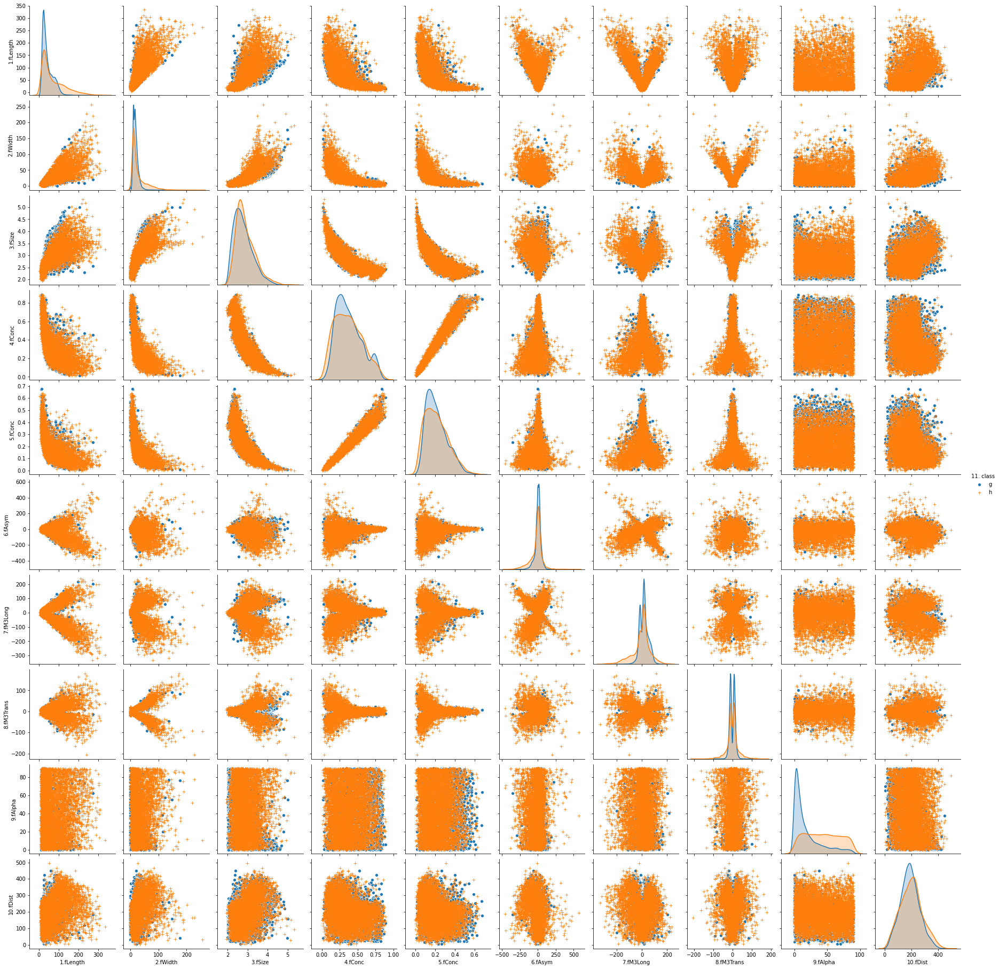

In [16]:
import seaborn as sns
sns.pairplot(df, hue="11. class", markers=['o','+'] )

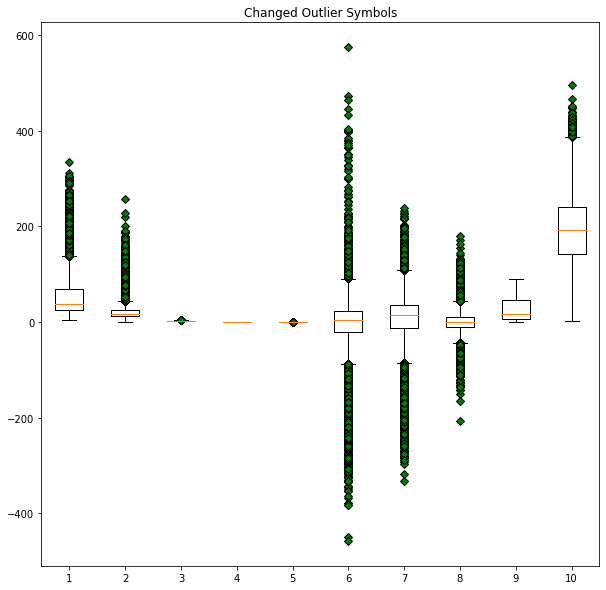

Data without repetition: 18905
gamma: 12332
background: 6573




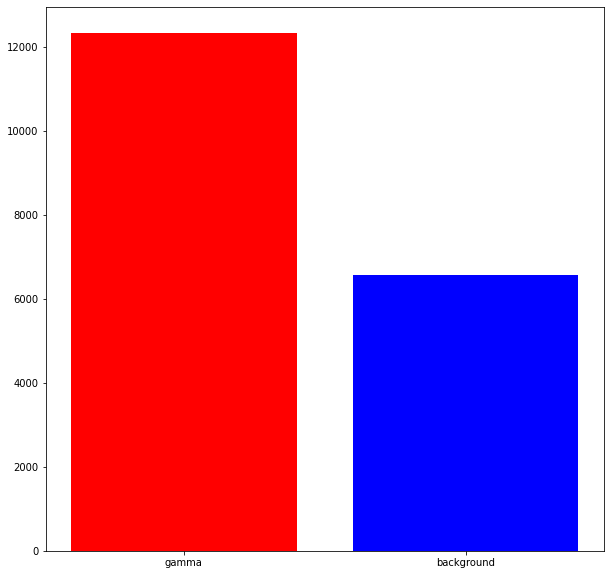

Original data: 19020
gamma: 12332
background: 6688




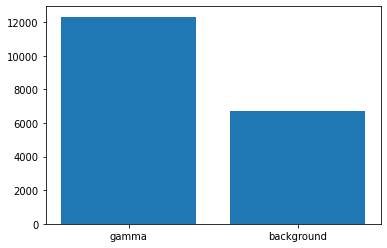

Train set dimension: 15124
gamma: 9855
background: 5269


Test set dimension: 3781
gamma: 2477
background: 1304


,0,1,2,3,4,5,6,7,8
count,15124.000000,15124.000000,15124.000000,15124.000000,15124.000000,15124.000000,15124.000000,15124.000000,15124.000000
mean,53.003128,22.129154,2.822838,0.380740,-4.255386,10.418203,0.234897,27.638674,193.661641
std,42.007737,18.342295,0.471774,0.182414,58.777830,50.679494,20.787355,26.097605,74.778015
min,4.283500,0.000000,1.946800,0.013100,-382.594000,-331.780000,-205.894700,0.000000,1.282600
25%,24.392475,11.841525,2.475700,0.237000,-20.331325,-12.886800,-10.843175,5.558200,142.101225
50%,37.042950,17.132600,2.739200,0.354600,3.981700,15.252450,0.934700,17.679500,192.126750
75%,69.723525,24.661900,3.095900,0.505000,24.038000,35.433750,10.948825,45.867750,240.736475
max,334.177000,256.382000,5.323300,0.893000,575.240700,231.446000,179.851000,90.000000,495.561000


In [15]:

green_diamond = dict(markerfacecolor='g', marker='D')
fig3, ax3 = plt.subplots(figsize=(10, 10))
ax3.set_title('Changed Outlier Symbols')
ax3.boxplot(data, flierprops=green_diamond)
plt.show()

gamma = 0
background = 0 
gamma_no_out = 0
background_no_out = 0 

for x in no_copy_labels: 
  if x =='g': 
    gamma_no_out+=1 
  elif x=='h':
    background_no_out+=1

for x in labels: 
  if x =='g': 
    gamma+=1 
  elif x=='h':
    background+=1  


print("Data without repetition:",gamma_no_out+background_no_out)
print("gamma:", gamma_no_out)
print("background:", background_no_out)    
print("\n")

fig = plt.figure(figsize=(10,10))
x = np.arange(2)
plt.bar(x, height=[gamma_no_out,background_no_out],color=['red','blue'])
plt.xticks(x, ['gamma','background'])
plt.show()

print("Original data:",gamma+background)
print("gamma:",gamma)
print("background:",background)
print("\n")

x = np.arange(2)
plt.bar(x, height=[gamma,background])
plt.xticks(x, ['gamma','background'])
plt.show()

from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from sklearn import preprocessing


X_train, X_test, y_train, y_test = train_test_split(no_copy_data, no_copy_labels, test_size=0.2, random_state=100)


c_g = 0
c_h = 0
for x in y_train: 
  if (x=='g'):
    c_g+=1
  else : c_h+=1 

print("Train set dimension:", c_g + c_h)
print("gamma:",c_g)
print("background:",c_h)
print("\n")

g_test = 0
h_test = 0
for x in y_test: 
  if (x=='g'):
    g_test+=1
  else : h_test+=1 

print("Test set dimension:", g_test + h_test)
print("gamma:",g_test)
print("background:",h_test)


df_data =pd.DataFrame(X_train) 
df_data = df_data.astype(float) 
df_labels=pd.DataFrame(y_train,columns=[10]) 
df_train = pd.concat([df_data, df_labels], axis=1)

df_train.describe()

#df_train


**Train**

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn import tree


kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=100)

class_f1_results = []
class_acc_results = []
class_auc_results = []

for Depth in [5,10,20,50]:
#for K in [1,3,5,7,11,13,15]:
#for C in [0.01,0.1,1,10,100,1000,10000]:
#for E in [10,50,100,250,500,750,1000]:
  #for G in [0.00001,0.0001,0.001,0.01,0.1,1,10]:
  #clf = LogisticRegression()
  clf = DecisionTreeClassifier(max_depth=Depth)
  #clf= RandomForestClassifier(n_estimators=E)
  #clf = KNeighborsClassifier(K)
  #clf = svm.SVC(C=C,gamma=G,probability = True)

  #print("#############")
  #print(K)
  #print(C,G)
  #print(E)
  print(Depth)

  f1_results =[]
  acc_results = []
  auc_results = []

  for train_ix, test_ix in kfold.split(X_train, y_train):

      train_X, val_X = X_train[train_ix], X_train[test_ix]
      train_y, val_y = y_train[train_ix], y_train[test_ix]

      temp = pd.DataFrame(train_X)
      temp1 = temp.astype(float) 
      temp2=pd.DataFrame(train_y,columns=[10]) 
      df_cv = pd.concat([temp1, temp2], axis=1)

      cv_g = 0
      cv_h = 0
      for x in train_y: 
        if (x=='g'):
          cv_g+=1
        else : cv_h+=1 

      print("Train set dimension:", cv_g + cv_h)
      print("gamma:",cv_g)
      print("background:",cv_h)
      print("\n")

      balance_data, balance_labels = undersampling(df_cv, cv_h)
    
      #balance_data, balance_labels = mixsampling(train_X, train_y)

      balanced_g = 0
      balanced_h = 0
      for x in balance_labels: 
        if (x=='g'):
          balanced_g+=1
        else : balanced_h+=1 

      print("Train set dimension:", balanced_g + balanced_h)
      print("gamma:",balanced_g)
      print("background:", balanced_h)
      print("\n")

      acc,f1,auc = training(val_X, val_y, balance_data, balance_labels, clf)

      f1_results.append(f1)
      acc_results.append(acc)
      auc_results.append(auc)

      media_f1 = np.mean(f1_results)
      media_acc = np.mean(acc_results)
      media_auc = np.mean(auc_results) 

      print(f1_results,media_f1)
      print("\n")

  tree.plot_tree(clf) 

  class_f1_results.append(media_f1) 
  class_acc_results.append(media_acc)
  class_auc_results.append(media_auc)
     
print("Accuracy : ",class_acc_results)
print("F1 score : ",class_f1_results)
print("AUC score : ",class_auc_results)

**Test**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm

#clf = LogisticRegression()
clf = DecisionTreeClassifier(max_depth=10)
#lf= RandomForestClassifier(n_estimators=750)
#clf = KNeighborsClassifier(15)
#clf = svm.SVC(C=10000,gamma=1,probability = True)     

#balance_data, balance_labels = undersampling(df_train, c_h)
balance_data, balance_labels = mixsampling(X_train, y_train)

score = training(X_test, y_test, balance_data, balance_labels, clf, ROC=True)